[1. 0. 0.]
0.5818963741493924
random vectors:  [array([0.00906426, 0.99995892])]
random vectors:  [array([0.00906426, 0.99995892]), array([-0.0011878 ,  0.99999929])]
random vectors:  [array([0.00906426, 0.99995892]), array([-0.0011878 ,  0.99999929]), array([0.01170332, 0.99993151])]
random vectors:  [array([0.00906426, 0.99995892]), array([-0.0011878 ,  0.99999929]), array([0.01170332, 0.99993151]), array([0.0118012 , 0.99993036])]
random vectors:  [array([0.00906426, 0.99995892]), array([-0.0011878 ,  0.99999929]), array([0.01170332, 0.99993151]), array([0.0118012 , 0.99993036]), array([0.00799003, 0.99996808])]
random vectors:  [array([0.00906426, 0.99995892]), array([-0.0011878 ,  0.99999929]), array([0.01170332, 0.99993151]), array([0.0118012 , 0.99993036]), array([0.00799003, 0.99996808]), array([-0.01086916,  0.99994093])]
random vectors:  [array([0.00906426, 0.99995892]), array([-0.0011878 ,  0.99999929]), array([0.01170332, 0.99993151]), array([0.0118012 , 0.99993036]), array

IndexError: index 2 is out of bounds for axis 0 with size 2

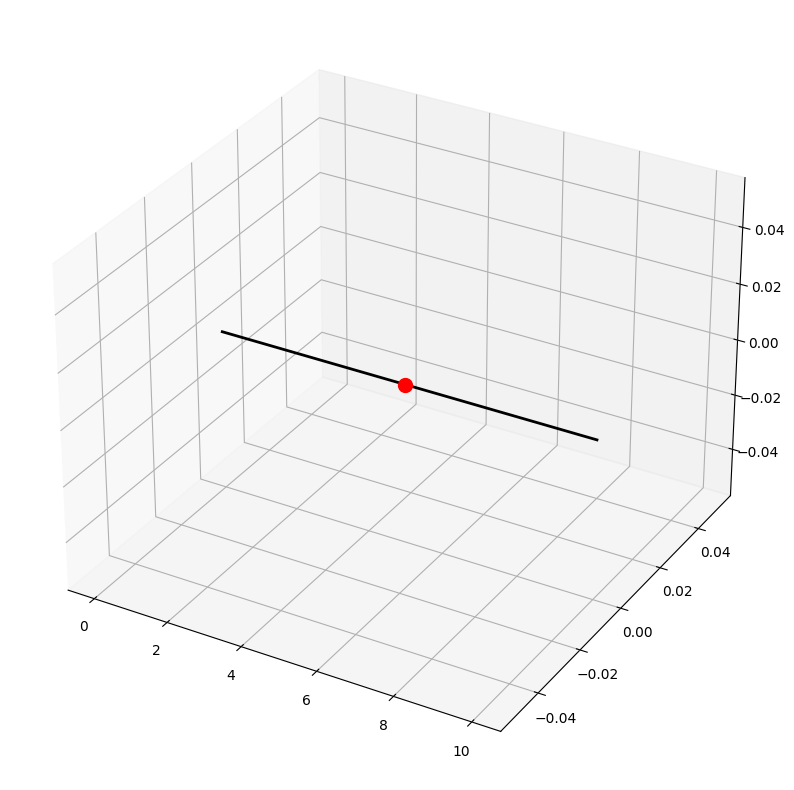

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


import numpy as np
from scipy.spatial.transform import Rotation as R

def generate_random_vectors(original_vector, num_vectors, theta_deg, thetamax_deg, magnitude_range):
    # Normalize the original vector
    original_vector_normalized = original_vector / np.linalg.norm(original_vector)
    
    # Convert angles to radians
    theta_rad = np.radians(theta_deg)
    thetamax_rad = np.radians(thetamax_deg)
    
    random_vectors = []
    
    for _ in range(num_vectors):
        # Generate a random angle between theta and thetamax
        random_angle = np.random.uniform(theta_rad, thetamax_rad)
        
        # Generate a random azimuthal angle (360 degrees)
        random_azimuth = np.random.uniform(0, 2 * np.pi)
        
        # Convert polar coordinates to Cartesian coordinates
        x = np.sin(random_angle) * np.cos(random_azimuth)
        y = np.sin(random_angle) * np.sin(random_azimuth)
        z = np.cos(random_angle)
        
        # Scale the vector by a random magnitude within the given range
        random_magnitude = np.random.uniform(magnitude_range[0], magnitude_range[1])
        random_vector = random_magnitude * np.array([x, y, z])
        
        # Rotate the random vector to align with the original vector's direction
        rotation_matrix = np.linalg.qr([original_vector_normalized, random_vector])[0]
        rotated_random_vector = rotation_matrix[1]
        
        random_vectors.append(rotated_random_vector)
        print("random vectors: ", random_vectors   )
    return (x, y, z)


track_start = (0,0,0)
track_end = (10,0,0)

# track direction vector
track_dir = np.array(track_end) - np.array(track_start)

# normalize track direction vector
track_dir = track_dir / np.linalg.norm(track_dir)
print(track_dir)

emission_point = (5,0,0)
number = 1000
refractive_index = 1.33
v = 0.9
c = 299792458 # m/s speed of light in vacuum
delta_cherenkov_angle = 0.1 # degrees
cherenkov_angle = np.arccos(1/(v*refractive_index))  # simplified from (c/(v*refractive_index)) as v is is units of c already

print(cherenkov_angle)

#create 'number' random cherenkov direction vectors in the angle 'cherenkov_angle' from the track direction vector 
# Generate random normalized direction vectors
cherenkov_dirs = generate_random_vectors(track_dir, number, cherenkov_angle, cherenkov_angle+delta_cherenkov_angle, (1.0,1.0))
print(cherenkov_dirs)

# create figure
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

# plot track
ax.plot([track_start[0], track_end[0]], [track_start[1], track_end[1]], [track_start[2], track_end[2]], color='black', linewidth=2)

# plot emission point
ax.scatter(emission_point[0], emission_point[1], emission_point[2], color='red', s=100)

# plot short lines from emission point following each particle direction
for cherenkov_dir in cherenkov_dirs:
    ax.plot([emission_point[0], emission_point[0]+cherenkov_dir[0]], [emission_point[1], emission_point[1]+cherenkov_dir[1]], [emission_point[2], emission_point[2]+cherenkov_dir[2]], color='blue', linewidth=0.5)



# plot track direction vector
plt.show()

In [ ]:
def rotate_vectors_to_reference(vectors, target_vector, reference_vector): # target vector and reference vector need to be swapped in order here and then swapped in name throughout the function
    # Ensure that vectors, reference_vector, and target_vector are NumPy arrays
    vectors = np.array(vectors)
    reference_vector = np.array(reference_vector)
    target_vector = np.array(target_vector)

    # Calculate the rotation matrix using the cross product
    cross_product = np.cross(target_vector, reference_vector)
    dot_product = np.dot(target_vector, reference_vector)

    # Create the rotation matrix
    skew_matrix = np.array([[0, -cross_product[2], cross_product[1]],
                             [cross_product[2], 0, -cross_product[0]],
                             [-cross_product[1], cross_product[0], 0]])

    rotation_matrix = np.eye(3) + skew_matrix + \
                     np.dot(skew_matrix, skew_matrix) * (1 - dot_product) / np.linalg.norm(cross_product) ** 2

    # Apply the rotation to all vectors
    rotated_vectors = np.dot(rotation_matrix, vectors.T).T

    return rotated_vectors

def cherenkov_angles(track_start, track_end, track_velocity, emission_point, num_vectors, cone_thickness, max_magnitude, refractive_index=1.33):
    # track direction vector
    track_dir = np.array(track_end) - np.array(track_start)
    track_dir = track_dir / np.linalg.norm(track_dir)

    # Define the parameters of the cone
    target_vector = track_dir

    emission_point = np.array(emission_point)  # Common starting point

    # Convert the cone angle from degrees to radians
    cone_thickness_radians = np.radians(cone_thickness)

    # m/s speed of light in vacuum
    cherenkov_angle = np.arccos(1/(track_velocity*refractive_index)) #radiens  # simplified from (c/(v*refractive_index)) as v is is units of c already

    # Generate random vectors forming a cone
    reference_vector = np.array([0, 0, 1])  # Reference vector
    random_vectors = []
    for _ in range(num_vectors):
        # Generate random values for spherical coordinates
        theta = np.random.uniform(0, 2 * np.pi)  # Azimuthal angle
        phi = np.random.uniform(cherenkov_angle, cherenkov_angle + cone_thickness_radians)  # Polar angle within the cone #NOTE: Cone thickness is currently [(cone), (cone + cone_thickness)] rather than [(cone - cone_thickness/2), (cone + cone_thickness/2)] 

        # Calculate the Cartesian coordinates
        x = max_magnitude * np.sin(phi) * np.cos(theta)
        y = max_magnitude * np.sin(phi) * np.sin(theta)
        z = max_magnitude * np.cos(phi)

        # Create the random vector
        random_vector = np.array([x, y, z])

        # Ensure that the vector starts from the common starting point
        random_vector += emission_point

        random_vectors.append(random_vector)

    random_vectors = rotate_vectors_to_reference(random_vectors, reference_vector, target_vector)

    return random_vectors

track_start = (0,0,0)
track_end = (10,0,0)
emission_point = (5,0,0)
num_vectors = 1000  # Number of vectors to generate
cone_thickness = 1 # Angle of the cone thickness in degrees
max_magnitude = 1.0  # Maximum magnitude of the vectors
track_velocity = 0.9 # units of c 
cherenkov_angles(track_start, track_end, track_velocity, emission_point, num_vectors, cone_thickness, max_magnitude, refractive_index=1.33)

